In [1]:
import optuna
import mlflow
import mlflow.sklearn
import matplotlib.pyplot as plt
import seaborn           as sns
import numpy             as np
import pandas            as pd

from sklearn.model_selection         import train_test_split
from sklearn.metrics                 import *
from sklearn.feature_extraction.text import TfidfVectorizer
from mlflow.models.signature         import infer_signature
from sklearn.linear_model            import LogisticRegression
from sklearn.svm                     import SVC
from xgboost                         import XGBClassifier
from lightgbm                        import LGBMClassifier
from sklearn.neighbors               import KNeighborsClassifier
from sklearn.naive_bayes             import MultinomialNB
from sklearn.ensemble                import RandomForestClassifier
from imblearn.over_sampling          import SMOTE

In [2]:
df = pd.read_csv('preprocessed_corpus.csv')
df.head()

,raw_comment,category,word_count_raw,char_count_raw,num_unique_words,num_upper_words,num_punctuation_raw,cleaned_comment,num_stop_words,processed_comment,final_word_count,final_char_count
0,family mormon have never tried explain them t...,1,39,261,34,0,0,family mormon have never tried explain them th...,13,family mormon never tried explain still stare ...,26,171
1,buddhism has very much lot compatible with chr...,1,196,1269,136,0,0,buddhism has very much lot compatible with chr...,56,buddhism much lot compatible christianity espe...,140,842
2,seriously don say thing first all they won get...,-1,86,460,67,0,0,seriously don say thing first all they won get...,40,seriously say thing first get complex explain ...,46,230
3,what you have learned yours and only yours wha...,0,29,168,24,0,0,what you have learned yours and only yours wha...,14,learned want teach different focus goal not wr...,15,87
4,for your own benefit you may want read living ...,1,112,691,82,0,0,for your own benefit you may want read living ...,46,benefit may want read living buddha living chr...,66,397


In [3]:
# Step 2: Set up the MLflow tracking server
mlflow.set_tracking_uri("http://ec2-13-201-96-130.ap-south-1.compute.amazonaws.com:5000/")

In [4]:
# create an experiment 
mlflow.create_experiment(
                            name              = "Experiment_6_LightGBM_with_hpt",
                            artifact_location = "s3://mlflow-s3-25/Experiment_6_LightGBM_with_hpt"
                        )

'365046524494083480'

In [5]:
# set an experiment
mlflow.set_experiment("Experiment_6_LightGBM_with_hpt")

<Experiment: artifact_location='s3://mlflow-s3-25/Experiment_6_LightGBM_with_hpt', creation_time=1756984388988, experiment_id='365046524494083480', last_update_time=1756984388988, lifecycle_stage='active', name='Experiment_6_LightGBM_with_hpt', tags={}>

In [7]:
# Step 1: Remap the class labels from [-1, 0, 1] to [2, 0, 1]
df['category']       = df['category'].map({-1: 2, 0: 0, 1: 1})

# Step 4: Train-test split before vectorization and resampling
X_train, X_test, y_train, y_test = train_test_split(df['processed_comment'], df['category'], test_size=0.2, random_state=42, stratify=df['category'])

# Step 2: Vectorization using TF-IDF, fit on training data only
ngram_range          = (1, 3)                                    # Trigram setting
max_features         = 1000                                      # Set max_features to 1000 for TF-IDF

vectorizer           = TfidfVectorizer(ngram_range=ngram_range, max_features=max_features)
X_train_vec          = vectorizer.fit_transform(X_train)          # Fit on training data
X_test_vec           = vectorizer.transform    (X_test)           # Transform test data

smote                = SMOTE(random_state=42)
X_train_vec, y_train = smote.fit_resample(X_train_vec, y_train)

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\base.py:474: FutureWarning: `BaseEstimator._validate_data` is deprecated in 1.6 and will be removed in 1.7. Use `sklearn.utils.validation.validate_data` instead. This function becomes public and is part of the scikit-learn developer API.
  warnings.warn(


In [8]:
# Function to log results in MLflow
def log_mlflow(model_name, model, params):
    with mlflow.start_run() as run:
        # Log model type
        mlflow.set_tag("mlflow.runName",  f"{model_name}_SMOTE_TFIDF_Trigrams")
        mlflow.set_tag("experiment_type", "algorithm_comparison")

        # Log algorithm name as a parameter
        mlflow.log_param("algo_name", model_name)

        # Log hyperparameters
        for key, value in params.items():
            mlflow.log_param(key, value)
            
        # Train model
        model.fit(X_train_vec, y_train)

        # Step 6: Make predictions and log metrics
        y_pred             = model.predict(X_test_vec)

        # Step 5: Compute Evaluation Metrics
        accuracy           = accuracy_score       (y_test, y_pred)
        
        macro_precision    = precision_score      (y_test, y_pred, average='macro')
        macro_recall       = recall_score         (y_test, y_pred, average='macro')            # Recall or Sensitivity
        macro_F1_score     = f1_score             (y_test, y_pred, average='macro')
        macro_roc_auc      = roc_auc_score        (y_test, model.predict_proba(X_test_vec), average='macro', multi_class='ovr')
        weighted_precision = precision_score      (y_test, y_pred, average='weighted')
        weighted_recall    = recall_score         (y_test, y_pred, average='weighted')         # Recall or Sensitivity
        weighted_F1_score  = f1_score             (y_test, y_pred, average='weighted')
        weighted_roc_auc   = roc_auc_score        (y_test, model.predict_proba(X_test_vec), average='weighted', multi_class='ovr')
        
        log_loss_value     = log_loss             (y_test, model.predict_proba(X_test_vec))
        cm                 = confusion_matrix     (y_test,y_pred)
        cr                 = classification_report(y_test, y_pred)
        
        # Step 7: Log Class-wise Metrics from Classification Report
        classification_rep = classification_report(y_test, y_pred, output_dict=True)

        for label, metrics in classification_rep.items():
            clean_label    = label.replace(" avg", "")                   # Remove " avg" from label if present
            if isinstance(metrics, dict):
                for metric, value in metrics.items():
                    mlflow.log_metric(f"{clean_label}_{metric}", value)  
            else:
                mlflow.log_metric(f"{clean_label}", metrics)             # Logs accuracy metric
        
        # Step 6: Log Remaining Metrics to MLflow
        mlflow.log_metric("log_loss",         log_loss_value)        
        mlflow.log_metric("macro_roc_auc",    macro_roc_auc)
        mlflow.log_metric("weighted_roc_auc", weighted_roc_auc)
        
        # Step 8: Plot and Log Confusion Matrix
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
        plt.xlabel("Predicted")
        plt.ylabel("Actual")
        plt.title(f"Confusion Matrix : {model_name}_model")
        plt.savefig("confusion_matrix.png")
        mlflow.log_artifact("confusion_matrix.png")
    
        # Step 9: saving and logging the dataset
        df.to_csv("dataset.csv", index=False)
        mlflow.log_artifact("dataset.csv")
        
        # Step 10: Log Model and Dataset
        input_example = X_test_vec[:5]                                           # input_example provides a sample input for the model, 
                                                                                 # useful for UI display and validation
        signature     = infer_signature(X_train_vec, model.predict(X_train_vec)) # signature defines the expected input/output schema of the model, 
                                                                                 # enabling reproducibility and serving
        
        mlflow.sklearn.log_model(
                                    sk_model      = model,
                                    name          = f"{model_name}_model",
                                    input_example = input_example,
                                    signature     = signature
                                ) 
        # Step 11: Print Evaluation Summary
        print(f"\033[1m\033[4mEvaluation Metrics : {model_name}_model\033[0m : (values close to 1 represent the GOOD Model)\n")
        print(f'\tAccuracy     : {accuracy:.2f}    --> [TP + TN]/ALL       : The proportion of correctly predicted observations over total predictions')
        print(f'\tLog Loss     : {log_loss_value:.2f}    --> Measures the performance of a classification model, Less is Good')
        print(f'\t\033[1m\033[4mMacro\033[0m  \t\t       --> Macro average       : Treats all classes equally by computing the unweighted mean of per-class metrics')
        print(f'\t  Precision  : {macro_precision:.2f}    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions ')
        print(f'\t  Recall     : {macro_recall:.2f}    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.')
        print(f'\t  F1-Score   : {macro_F1_score:.2f}    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences')
        print(f'\t  ROC-AUC    : {macro_roc_auc:.2f}    --> Measures the ability of the model to distinguish between classes.')
        
        print(f'\t\033[1m\033[4mWeighted\033[0m  \t       --> Weighted average    : Accounts for class imbalance by weighting each class metric by its support')
        print(f'\t  Precision  : {weighted_precision:.2f}    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions ')
        print(f'\t  Recall     : {weighted_recall:.2f}    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.')
        print(f'\t  F1-Score   : {weighted_F1_score:.2f}    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences')
        print(f'\t  ROC-AUC    : {weighted_roc_auc:.2f}    --> Measures the ability of the model to distinguish between classes.')
        
        
        print(f'\nConfusion Matix      :         -->    \033[1m\033[4mORIGINAL\033[0m     \t\t\033[1m\033[4mSTANDARD\033[0m\n')
        def format_row(row):
            formatted = ' '.join(f"{val:>2}" for val in row)
            return f"[{formatted}]"
        
        for row1, row2 in zip(cm, np.flip(cm)):
            print("\t\t\t\t  ", format_row(row1), "\t       ", format_row(row2))
        
        print("\nClassification Rpt   :")
        print('\n'.join('\t\t\t\t' + line for line in cr.splitlines()))

In [9]:
# Step 6: Optuna objective function for LightGBM
def objective_lightgbm(trial):
    # Hyperparameter space to explore
    n_estimators      = trial.suggest_int  ('n_estimators',      100, 1000)
    learning_rate     = trial.suggest_float('learning_rate',     1e-4, 1e-1, log=True)
    max_depth         = trial.suggest_int  ('max_depth',         3, 15)
    num_leaves        = trial.suggest_int  ('num_leaves',        20, 150)
    min_child_samples = trial.suggest_int  ('min_child_samples', 10, 100)
    colsample_bytree  = trial.suggest_float('colsample_bytree',  0.5, 1.0)
    subsample         = trial.suggest_float('subsample',         0.5, 1.0)
    reg_alpha         = trial.suggest_float('reg_alpha',         1e-4, 10.0, log=True)   # L1 regularization
    reg_lambda        = trial.suggest_float('reg_lambda',        1e-4, 10.0, log=True)   # L2 regularization


    # Create LightGBM model
    model = LGBMClassifier(
                            n_estimators      = n_estimators,
                            learning_rate     = learning_rate,
                            max_depth         = max_depth,
                            num_leaves        = num_leaves,
                            min_child_samples = min_child_samples,
                            colsample_bytree  = colsample_bytree,
                            subsample         = subsample,
                            reg_alpha         = reg_alpha,
                            reg_lambda        = reg_lambda,
                            random_state      = 42
                          )
    
    return accuracy_score(y_test, model.fit(X_train_vec, y_train).predict(X_test_vec))

In [10]:
# Run Optuna hyperparameter optimization for xgboost and log the best model only
def run_optuna_experiment():
    study         = optuna.create_study(direction="maximize")                         # Create an Optuna study to maximize accuracy
    study.optimize(objective_lightgbm, n_trials=100)                                  # Run optimization for 30 trials using the objective function


    best_params   = study.best_params                                                 # Retrieve the best hyperparameters from the study
    best_model    = LGBMClassifier(                                                    # Rebuild the model using the best-found parameters
                                    n_estimators      = best_params['n_estimators'],
                                    learning_rate     = best_params['learning_rate'],
                                    max_depth         = best_params['max_depth'],
                                    num_leaves        = best_params['num_leaves'],
                                    min_child_samples = best_params['min_child_samples'],
                                    colsample_bytree  = best_params['colsample_bytree'],
                                    subsample         = best_params['subsample'],
                                    reg_alpha         = best_params['reg_alpha'],
                                    reg_lambda        = best_params['reg_lambda'],
                                    random_state      = 42
                                  )

    return study, best_model                                                                    

In [11]:
# Run the experiment for LightGBM
study, best_model = run_optuna_experiment()

[I 2025-09-04 16:43:21,430] A new study created in memory with name: no-name-6ae62abb-2bb1-42cd-8733-d60f5bf60de0


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.125354 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101611
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 957
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:44:00,129] Trial 0 finished with value: 0.7424945414847162 and parameters: {'n_estimators': 468, 'learning_rate': 0.016953578441094623, 'max_depth': 8, 'num_leaves': 112, 'min_child_samples': 99, 'colsample_bytree': 0.6855759494014475, 'subsample': 0.9089016607080872, 'reg_alpha': 0.005632677464910475, 'reg_lambda': 0.05939768257832182}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.150474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:46:14,621] Trial 1 finished with value: 0.6468340611353712 and parameters: {'n_estimators': 814, 'learning_rate': 0.0008326259942078375, 'max_depth': 11, 'num_leaves': 84, 'min_child_samples': 49, 'colsample_bytree': 0.9174367120760312, 'subsample': 0.9046768573166444, 'reg_alpha': 0.00011051931833897274, 'reg_lambda': 4.922308098523025}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.134679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:48:11,432] Trial 2 finished with value: 0.712745633187773 and parameters: {'n_estimators': 797, 'learning_rate': 0.005699398179612029, 'max_depth': 9, 'num_leaves': 57, 'min_child_samples': 47, 'colsample_bytree': 0.6605268476620165, 'subsample': 0.6747534718218755, 'reg_alpha': 0.16921413872385552, 'reg_lambda': 4.413751694661731}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.144675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102150
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:48:48,246] Trial 3 finished with value: 0.5532205240174672 and parameters: {'n_estimators': 834, 'learning_rate': 0.00013569374543652535, 'max_depth': 3, 'num_leaves': 128, 'min_child_samples': 17, 'colsample_bytree': 0.6402210344568136, 'subsample': 0.9232358052841989, 'reg_alpha': 0.26235175873896077, 'reg_lambda': 6.583087500169878}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.187019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:49:17,301] Trial 4 finished with value: 0.6296397379912664 and parameters: {'n_estimators': 289, 'learning_rate': 0.000816399583793557, 'max_depth': 8, 'num_leaves': 142, 'min_child_samples': 53, 'colsample_bytree': 0.7273107966899618, 'subsample': 0.6582158612907922, 'reg_alpha': 6.22299371993263, 'reg_lambda': 0.0008285150228945129}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.171453 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:51:39,837] Trial 5 finished with value: 0.6546124454148472 and parameters: {'n_estimators': 628, 'learning_rate': 0.0016277357574918298, 'max_depth': 9, 'num_leaves': 93, 'min_child_samples': 35, 'colsample_bytree': 0.6892894349913378, 'subsample': 0.6253029825260161, 'reg_alpha': 0.0059115119558824985, 'reg_lambda': 0.0001221750216847001}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.173119 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101801
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 963
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:52:36,266] Trial 6 finished with value: 0.6555676855895196 and parameters: {'n_estimators': 928, 'learning_rate': 0.0034724298431997526, 'max_depth': 4, 'num_leaves': 105, 'min_child_samples': 88, 'colsample_bytree': 0.7453464401903307, 'subsample': 0.6316112722567027, 'reg_alpha': 0.00010760508063941391, 'reg_lambda': 0.023706184474603584}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.226458 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:55:17,591] Trial 7 finished with value: 0.6277292576419214 and parameters: {'n_estimators': 887, 'learning_rate': 0.00063441445014396, 'max_depth': 8, 'num_leaves': 81, 'min_child_samples': 49, 'colsample_bytree': 0.9247371526975952, 'subsample': 0.5334469074033128, 'reg_alpha': 0.012351635898062015, 'reg_lambda': 0.007331612112461806}. Best is trial 0 with value: 0.7424945414847162.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048872 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101611
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 957
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:55:35,282] Trial 8 finished with value: 0.7475436681222707 and parameters: {'n_estimators': 509, 'learning_rate': 0.014137518163528833, 'max_depth': 10, 'num_leaves': 35, 'min_child_samples': 99, 'colsample_bytree': 0.7152247688692683, 'subsample': 0.9352751748724293, 'reg_alpha': 0.0030292698232571823, 'reg_lambda': 0.008379289651995126}. Best is trial 8 with value: 0.7475436681222707.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048375 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:55:48,383] Trial 9 finished with value: 0.660207423580786 and parameters: {'n_estimators': 181, 'learning_rate': 0.0020539998480464837, 'max_depth': 14, 'num_leaves': 61, 'min_child_samples': 34, 'colsample_bytree': 0.8195488009958765, 'subsample': 0.6731199835829696, 'reg_alpha': 0.41458801541978996, 'reg_lambda': 0.0061091307251530955}. Best is trial 8 with value: 0.7475436681222707.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041804 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:56:03,659] Trial 10 finished with value: 0.769650655021834 and parameters: {'n_estimators': 473, 'learning_rate': 0.0932523531821374, 'max_depth': 15, 'num_leaves': 21, 'min_child_samples': 78, 'colsample_bytree': 0.5392251579938888, 'subsample': 0.9949788332358691, 'reg_alpha': 0.0012692312465090033, 'reg_lambda': 0.13247785451822844}. Best is trial 10 with value: 0.769650655021834.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:56:20,149] Trial 11 finished with value: 0.771424672489083 and parameters: {'n_estimators': 481, 'learning_rate': 0.059101430092125574, 'max_depth': 15, 'num_leaves': 29, 'min_child_samples': 75, 'colsample_bytree': 0.5279245239533059, 'subsample': 0.9959521994069089, 'reg_alpha': 0.003473257026387782, 'reg_lambda': 0.18977662467426692}. Best is trial 11 with value: 0.771424672489083.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:56:31,921] Trial 12 finished with value: 0.771561135371179 and parameters: {'n_estimators': 369, 'learning_rate': 0.09296768276748239, 'max_depth': 15, 'num_leaves': 25, 'min_child_samples': 72, 'colsample_bytree': 0.5054406823302031, 'subsample': 0.9999332561627193, 'reg_alpha': 0.0008340264737107788, 'reg_lambda': 0.28841024272595667}. Best is trial 12 with value: 0.771561135371179.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049867 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:56:41,415] Trial 13 finished with value: 0.773471615720524 and parameters: {'n_estimators': 317, 'learning_rate': 0.07198854947148269, 'max_depth': 13, 'num_leaves': 43, 'min_child_samples': 70, 'colsample_bytree': 0.5048848271907596, 'subsample': 0.8185846895235904, 'reg_alpha': 0.0006990372668542487, 'reg_lambda': 0.6205281105187634}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.038867 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:56:51,827] Trial 14 finished with value: 0.7639192139737991 and parameters: {'n_estimators': 311, 'learning_rate': 0.029081923757294625, 'max_depth': 13, 'num_leaves': 48, 'min_child_samples': 67, 'colsample_bytree': 0.5933005486100145, 'subsample': 0.8039796705190535, 'reg_alpha': 0.0006729324101326126, 'reg_lambda': 0.6738176681086405}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.034130 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101931
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 968
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:57:00,940] Trial 15 finished with value: 0.763782751091703 and parameters: {'n_estimators': 308, 'learning_rate': 0.032508657655001896, 'max_depth': 12, 'num_leaves': 43, 'min_child_samples': 65, 'colsample_bytree': 0.5149891491534722, 'subsample': 0.7897982100853803, 'reg_alpha': 0.000553549129828463, 'reg_lambda': 0.40826487974402864}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034753 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:57:05,045] Trial 16 finished with value: 0.7654203056768559 and parameters: {'n_estimators': 130, 'learning_rate': 0.09786485631902833, 'max_depth': 13, 'num_leaves': 68, 'min_child_samples': 81, 'colsample_bytree': 0.5904075788304541, 'subsample': 0.8387440475199522, 'reg_alpha': 0.022483519604902497, 'reg_lambda': 1.2830897694536123}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046866 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102021
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:57:17,705] Trial 17 finished with value: 0.7242085152838428 and parameters: {'n_estimators': 656, 'learning_rate': 0.011221447211781914, 'max_depth': 6, 'num_leaves': 21, 'min_child_samples': 63, 'colsample_bytree': 0.8085265836170036, 'subsample': 0.7404646320836039, 'reg_alpha': 0.0655855911141057, 'reg_lambda': 1.6606752669247444}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037541 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101771
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 962
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:57:28,539] Trial 18 finished with value: 0.7681495633187773 and parameters: {'n_estimators': 372, 'learning_rate': 0.04140192698838061, 'max_depth': 12, 'num_leaves': 42, 'min_child_samples': 89, 'colsample_bytree': 0.5636124147409087, 'subsample': 0.8540956566971096, 'reg_alpha': 0.0004620277986366081, 'reg_lambda': 0.05683935220420315}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049544 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:57:57,800] Trial 19 finished with value: 0.7493176855895196 and parameters: {'n_estimators': 616, 'learning_rate': 0.008680831681721776, 'max_depth': 15, 'num_leaves': 71, 'min_child_samples': 71, 'colsample_bytree': 0.996713449915247, 'subsample': 0.7585926658121385, 'reg_alpha': 1.4471650029109782, 'reg_lambda': 0.30299019798191945}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036446 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:58:07,956] Trial 20 finished with value: 0.7426310043668122 and parameters: {'n_estimators': 214, 'learning_rate': 0.023258636876376946, 'max_depth': 13, 'num_leaves': 53, 'min_child_samples': 39, 'colsample_bytree': 0.5031776293200494, 'subsample': 0.5182099207499433, 'reg_alpha': 0.00025088573112338434, 'reg_lambda': 0.9711584847966201}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.051427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:58:22,760] Trial 21 finished with value: 0.7718340611353712 and parameters: {'n_estimators': 402, 'learning_rate': 0.05088107395260357, 'max_depth': 15, 'num_leaves': 31, 'min_child_samples': 76, 'colsample_bytree': 0.6121561991254725, 'subsample': 0.9849966845071025, 'reg_alpha': 0.00212316185922633, 'reg_lambda': 0.1922487693699602}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055123 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102043
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:58:37,344] Trial 22 finished with value: 0.7712882096069869 and parameters: {'n_estimators': 394, 'learning_rate': 0.05605593491060376, 'max_depth': 14, 'num_leaves': 30, 'min_child_samples': 60, 'colsample_bytree': 0.6135566652945077, 'subsample': 0.9619076969920035, 'reg_alpha': 0.0014610985490339323, 'reg_lambda': 0.13729018047074354}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038512 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101801
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 963
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:58:51,518] Trial 23 finished with value: 0.7688318777292577 and parameters: {'n_estimators': 397, 'learning_rate': 0.06150800434708183, 'max_depth': 14, 'num_leaves': 38, 'min_child_samples': 88, 'colsample_bytree': 0.5602365704591502, 'subsample': 0.8902639923600302, 'reg_alpha': 0.0002577860118427667, 'reg_lambda': 0.028052789867308674}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040450 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:58:58,338] Trial 24 finished with value: 0.7689683406113537 and parameters: {'n_estimators': 240, 'learning_rate': 0.09743447058798592, 'max_depth': 11, 'num_leaves': 21, 'min_child_samples': 83, 'colsample_bytree': 0.5031848009994957, 'subsample': 0.8686003202638575, 'reg_alpha': 0.0014879417760552927, 'reg_lambda': 1.9433187829024905}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048617 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:59:12,954] Trial 25 finished with value: 0.7652838427947598 and parameters: {'n_estimators': 383, 'learning_rate': 0.026490703145312294, 'max_depth': 15, 'num_leaves': 32, 'min_child_samples': 74, 'colsample_bytree': 0.5707309393179798, 'subsample': 0.9619117708882747, 'reg_alpha': 0.011166056022084042, 'reg_lambda': 0.41122541606784163}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:59:30,488] Trial 26 finished with value: 0.771424672489083 and parameters: {'n_estimators': 562, 'learning_rate': 0.04758472550234544, 'max_depth': 12, 'num_leaves': 66, 'min_child_samples': 57, 'colsample_bytree': 0.6260981649848092, 'subsample': 0.9613910488553338, 'reg_alpha': 0.0009726429704916532, 'reg_lambda': 0.09083596075791299}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 16:59:56,706] Trial 27 finished with value: 0.7430403930131004 and parameters: {'n_estimators': 704, 'learning_rate': 0.006182417666014814, 'max_depth': 14, 'num_leaves': 56, 'min_child_samples': 68, 'colsample_bytree': 0.5411021477104943, 'subsample': 0.8179137409400383, 'reg_alpha': 0.06681334174523368, 'reg_lambda': 0.016425364903384466}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049234 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102150
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:00:03,195] Trial 28 finished with value: 0.6584334061135371 and parameters: {'n_estimators': 114, 'learning_rate': 0.00012967626070324709, 'max_depth': 13, 'num_leaves': 46, 'min_child_samples': 17, 'colsample_bytree': 0.805045649222959, 'subsample': 0.7201498685022318, 'reg_alpha': 0.0002545951078573885, 'reg_lambda': 0.0020991904552874687}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052208 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101611
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 957
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:00:22,812] Trial 29 finished with value: 0.7573689956331878 and parameters: {'n_estimators': 537, 'learning_rate': 0.018124428765468405, 'max_depth': 11, 'num_leaves': 76, 'min_child_samples': 98, 'colsample_bytree': 0.5957664755232701, 'subsample': 0.572810439761847, 'reg_alpha': 0.002867416344862757, 'reg_lambda': 0.08433080974401964}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:00:45,508] Trial 30 finished with value: 0.7609170305676856 and parameters: {'n_estimators': 414, 'learning_rate': 0.018264789111544995, 'max_depth': 15, 'num_leaves': 98, 'min_child_samples': 80, 'colsample_bytree': 0.6759155078523871, 'subsample': 0.8777791927860616, 'reg_alpha': 0.006736001331143569, 'reg_lambda': 0.054753615984386834}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:01,160] Trial 31 finished with value: 0.7716975982532751 and parameters: {'n_estimators': 464, 'learning_rate': 0.06360995887425723, 'max_depth': 15, 'num_leaves': 30, 'min_child_samples': 74, 'colsample_bytree': 0.5483268994469321, 'subsample': 0.9976610558732852, 'reg_alpha': 0.002622082817380915, 'reg_lambda': 0.2098937119808441}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.050376 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:12,755] Trial 32 finished with value: 0.7727893013100436 and parameters: {'n_estimators': 337, 'learning_rate': 0.06735388603061444, 'max_depth': 14, 'num_leaves': 31, 'min_child_samples': 68, 'colsample_bytree': 0.5375975399419223, 'subsample': 0.9315526953874059, 'reg_alpha': 0.0022906460498309193, 'reg_lambda': 0.2275201797325723}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039349 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102043
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:29,339] Trial 33 finished with value: 0.7691048034934498 and parameters: {'n_estimators': 436, 'learning_rate': 0.0389637038961542, 'max_depth': 14, 'num_leaves': 36, 'min_child_samples': 59, 'colsample_bytree': 0.5523351044679542, 'subsample': 0.9273129216471226, 'reg_alpha': 0.0026399312656262258, 'reg_lambda': 3.5849268572645547}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.072281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101708
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 960
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:36,055] Trial 34 finished with value: 0.7555949781659389 and parameters: {'n_estimators': 277, 'learning_rate': 0.06374961914460746, 'max_depth': 6, 'num_leaves': 50, 'min_child_samples': 93, 'colsample_bytree': 0.6578408551502166, 'subsample': 0.9140783457433888, 'reg_alpha': 0.04058637520866862, 'reg_lambda': 0.6552582826339388}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:49,490] Trial 35 finished with value: 0.6690775109170306 and parameters: {'n_estimators': 334, 'learning_rate': 0.00036390340120917374, 'max_depth': 13, 'num_leaves': 39, 'min_child_samples': 54, 'colsample_bytree': 0.6334693302308239, 'subsample': 0.9448907146171353, 'reg_alpha': 0.014712402616731715, 'reg_lambda': 9.003022800242988}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.037475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:01:57,725] Trial 36 finished with value: 0.7614628820960698 and parameters: {'n_estimators': 260, 'learning_rate': 0.03764238826856911, 'max_depth': 14, 'num_leaves': 122, 'min_child_samples': 84, 'colsample_bytree': 0.5799310314209757, 'subsample': 0.9776156422573297, 'reg_alpha': 0.00678525261626807, 'reg_lambda': 2.722077281699524}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.038777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:02:12,638] Trial 37 finished with value: 0.7697871179039302 and parameters: {'n_estimators': 570, 'learning_rate': 0.06270222634623844, 'max_depth': 12, 'num_leaves': 29, 'min_child_samples': 69, 'colsample_bytree': 0.5338959809457744, 'subsample': 0.8975361235680809, 'reg_alpha': 0.0003435076127033445, 'reg_lambda': 0.6326445014185988}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046734 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:02:32,171] Trial 38 finished with value: 0.6820414847161572 and parameters: {'n_estimators': 451, 'learning_rate': 0.0038242623500979686, 'max_depth': 10, 'num_leaves': 56, 'min_child_samples': 77, 'colsample_bytree': 0.6162220324801135, 'subsample': 0.8375366357137218, 'reg_alpha': 0.00013309888363206957, 'reg_lambda': 0.18686978457861358}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046412 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:02:43,647] Trial 39 finished with value: 0.7022379912663755 and parameters: {'n_estimators': 171, 'learning_rate': 0.010283324924731146, 'max_depth': 14, 'num_leaves': 63, 'min_child_samples': 44, 'colsample_bytree': 0.7084752089317269, 'subsample': 0.9097257168661761, 'reg_alpha': 0.001800655971909041, 'reg_lambda': 0.05893810470659291}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046546 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102021
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:02:58,826] Trial 40 finished with value: 0.7509552401746725 and parameters: {'n_estimators': 339, 'learning_rate': 0.022758031254380147, 'max_depth': 10, 'num_leaves': 147, 'min_child_samples': 64, 'colsample_bytree': 0.6539039234311765, 'subsample': 0.9538442167308142, 'reg_alpha': 0.00477757925347756, 'reg_lambda': 0.016076046105221207}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:03:09,761] Trial 41 finished with value: 0.7710152838427947 and parameters: {'n_estimators': 347, 'learning_rate': 0.0787654467607975, 'max_depth': 15, 'num_leaves': 26, 'min_child_samples': 72, 'colsample_bytree': 0.5183645683173832, 'subsample': 0.9976219681778387, 'reg_alpha': 0.000656472757057224, 'reg_lambda': 0.27829314625895235}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045004 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:03:27,122] Trial 42 finished with value: 0.7693777292576419 and parameters: {'n_estimators': 490, 'learning_rate': 0.07179100545141548, 'max_depth': 15, 'num_leaves': 36, 'min_child_samples': 73, 'colsample_bytree': 0.5495376585643706, 'subsample': 0.9809801847882654, 'reg_alpha': 0.0007498614792080504, 'reg_lambda': 0.2586254865946823}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040492 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:03:41,551] Trial 43 finished with value: 0.771561135371179 and parameters: {'n_estimators': 435, 'learning_rate': 0.04693575231231059, 'max_depth': 15, 'num_leaves': 24, 'min_child_samples': 77, 'colsample_bytree': 0.5245486371732887, 'subsample': 0.929694862538594, 'reg_alpha': 0.00014870226517575352, 'reg_lambda': 0.9996389112890256}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057105 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102021
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 972
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:03:50,849] Trial 44 finished with value: 0.6864082969432315 and parameters: {'n_estimators': 241, 'learning_rate': 0.0002074146056608898, 'max_depth': 13, 'num_leaves': 32, 'min_child_samples': 63, 'colsample_bytree': 0.5007815763056362, 'subsample': 0.9711374668029651, 'reg_alpha': 0.0022255133637525217, 'reg_lambda': 0.11813457147461995}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:04:13,536] Trial 45 finished with value: 0.6906386462882096 and parameters: {'n_estimators': 527, 'learning_rate': 0.0016958269076261874, 'max_depth': 14, 'num_leaves': 44, 'min_child_samples': 84, 'colsample_bytree': 0.571445830418494, 'subsample': 0.9420252249232368, 'reg_alpha': 0.004406019164358184, 'reg_lambda': 0.47131213527284066}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041764 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:04:32,558] Trial 46 finished with value: 0.7699235807860262 and parameters: {'n_estimators': 986, 'learning_rate': 0.09891032053226755, 'max_depth': 7, 'num_leaves': 88, 'min_child_samples': 52, 'colsample_bytree': 0.6056761995321279, 'subsample': 0.9978096111100004, 'reg_alpha': 0.0012755527641875857, 'reg_lambda': 0.22026149242502768}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039511 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:04:36,851] Trial 47 finished with value: 0.6980076419213974 and parameters: {'n_estimators': 292, 'learning_rate': 0.03186466461164819, 'max_depth': 3, 'num_leaves': 26, 'min_child_samples': 69, 'colsample_bytree': 0.5371104678960328, 'subsample': 0.9755999108244018, 'reg_alpha': 0.0009152240155552379, 'reg_lambda': 0.03443139924729649}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:04:48,752] Trial 48 finished with value: 0.7669213973799127 and parameters: {'n_estimators': 351, 'learning_rate': 0.051327209325192386, 'max_depth': 15, 'num_leaves': 40, 'min_child_samples': 94, 'colsample_bytree': 0.5873480484281148, 'subsample': 0.7049041427270157, 'reg_alpha': 0.0004007965640733014, 'reg_lambda': 0.8850795595326117}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046917 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:04:56,081] Trial 49 finished with value: 0.7685589519650655 and parameters: {'n_estimators': 192, 'learning_rate': 0.07504479337809619, 'max_depth': 14, 'num_leaves': 50, 'min_child_samples': 79, 'colsample_bytree': 0.7810446074856161, 'subsample': 0.7787724172904259, 'reg_alpha': 0.008960872834064866, 'reg_lambda': 0.15391096241679075}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.046651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101831
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 964
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:05:10,995] Trial 50 finished with value: 0.7540938864628821 and parameters: {'n_estimators': 482, 'learning_rate': 0.014667047101170071, 'max_depth': 13, 'num_leaves': 20, 'min_child_samples': 87, 'colsample_bytree': 0.8955112860247263, 'subsample': 0.9280536811336161, 'reg_alpha': 0.018940822263261763, 'reg_lambda': 0.0003301073185212821}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.035912 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:05:24,881] Trial 51 finished with value: 0.7700600436681223 and parameters: {'n_estimators': 451, 'learning_rate': 0.04466899864475956, 'max_depth': 15, 'num_leaves': 26, 'min_child_samples': 76, 'colsample_bytree': 0.5231371711447724, 'subsample': 0.9361080061208265, 'reg_alpha': 0.00010003900427067365, 'reg_lambda': 1.1158920664903456}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036579 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:05:37,702] Trial 52 finished with value: 0.7712882096069869 and parameters: {'n_estimators': 419, 'learning_rate': 0.03228633636988723, 'max_depth': 15, 'num_leaves': 25, 'min_child_samples': 72, 'colsample_bytree': 0.5221388411107954, 'subsample': 0.8934717107740129, 'reg_alpha': 0.00016346653196456292, 'reg_lambda': 0.4262920584987558}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056516 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 101885
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 966
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:05:49,260] Trial 53 finished with value: 0.7699235807860262 and parameters: {'n_estimators': 322, 'learning_rate': 0.05001888690219178, 'max_depth': 14, 'num_leaves': 33, 'min_child_samples': 66, 'colsample_bytree': 0.5534555402682874, 'subsample': 0.9854407139221961, 'reg_alpha': 0.000164348778051265, 'reg_lambda': 1.9257295299687236}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059474 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:05:59,925] Trial 54 finished with value: 0.7708788209606987 and parameters: {'n_estimators': 373, 'learning_rate': 0.07816952567856147, 'max_depth': 15, 'num_leaves': 20, 'min_child_samples': 76, 'colsample_bytree': 0.5023038846184444, 'subsample': 0.8627337866257877, 'reg_alpha': 0.00049272946456356, 'reg_lambda': 0.7082565561087784}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040756 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102043
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 973
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:06:16,960] Trial 55 finished with value: 0.6881823144104804 and parameters: {'n_estimators': 427, 'learning_rate': 0.0010184722126396753, 'max_depth': 14, 'num_leaves': 43, 'min_child_samples': 61, 'colsample_bytree': 0.530203713899801, 'subsample': 0.9181429121224208, 'reg_alpha': 3.5454940713112073, 'reg_lambda': 4.372518074502958}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066173 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 101861
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 965
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:06:36,593] Trial 56 finished with value: 0.7669213973799127 and parameters: {'n_estimators': 583, 'learning_rate': 0.023168352312450874, 'max_depth': 13, 'num_leaves': 27, 'min_child_samples': 81, 'colsample_bytree': 0.5740880050852105, 'subsample': 0.9586515430803455, 'reg_alpha': 0.001048572297444958, 'reg_lambda': 0.36488664792557307}. Best is trial 13 with value: 0.773471615720524.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.039652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102196
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 993
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:06:57,242] Trial 57 finished with value: 0.7790665938864629 and parameters: {'n_estimators': 503, 'learning_rate': 0.038420496657441724, 'max_depth': 15, 'num_leaves': 37, 'min_child_samples': 10, 'colsample_bytree': 0.5463357192625603, 'subsample': 0.8377556026816964, 'reg_alpha': 0.0021143838283720208, 'reg_lambda': 1.6017350691273944}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041746 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:07:09,005] Trial 58 finished with value: 0.7762008733624454 and parameters: {'n_estimators': 715, 'learning_rate': 0.08061945320620002, 'max_depth': 4, 'num_leaves': 35, 'min_child_samples': 32, 'colsample_bytree': 0.5582578852926899, 'subsample': 0.84387879746911, 'reg_alpha': 0.0022218008573230094, 'reg_lambda': 0.08710437407592773}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:07:20,993] Trial 59 finished with value: 0.7610534934497817 and parameters: {'n_estimators': 746, 'learning_rate': 0.03422998815462097, 'max_depth': 4, 'num_leaves': 48, 'min_child_samples': 23, 'colsample_bytree': 0.6002074699636967, 'subsample': 0.8232143120756411, 'reg_alpha': 0.001768963195616423, 'reg_lambda': 0.08885440915568919}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:07:34,006] Trial 60 finished with value: 0.7763373362445415 and parameters: {'n_estimators': 833, 'learning_rate': 0.07583384179528889, 'max_depth': 5, 'num_leaves': 59, 'min_child_samples': 25, 'colsample_bytree': 0.6427999332544114, 'subsample': 0.7826188558289299, 'reg_alpha': 0.002866722568780448, 'reg_lambda': 1.4721803567795915}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:07:45,793] Trial 61 finished with value: 0.7756550218340611 and parameters: {'n_estimators': 871, 'learning_rate': 0.0817522974229924, 'max_depth': 4, 'num_leaves': 35, 'min_child_samples': 23, 'colsample_bytree': 0.6416218468308799, 'subsample': 0.8026342443172743, 'reg_alpha': 0.0037192231773251023, 'reg_lambda': 2.858444185655809}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102179
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 989
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:07:58,959] Trial 62 finished with value: 0.7760644104803494 and parameters: {'n_estimators': 860, 'learning_rate': 0.08982731567398518, 'max_depth': 4, 'num_leaves': 36, 'min_child_samples': 13, 'colsample_bytree': 0.639849437200028, 'subsample': 0.7684576775587157, 'reg_alpha': 0.004135807506556045, 'reg_lambda': 6.254243521047241}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:08:11,097] Trial 63 finished with value: 0.773471615720524 and parameters: {'n_estimators': 856, 'learning_rate': 0.07896549808588586, 'max_depth': 4, 'num_leaves': 59, 'min_child_samples': 22, 'colsample_bytree': 0.6725407589193595, 'subsample': 0.7680077766467821, 'reg_alpha': 0.004087461461044686, 'reg_lambda': 7.041666614793445}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049624 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102192
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 992
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:08:23,437] Trial 64 finished with value: 0.7759279475982532 and parameters: {'n_estimators': 832, 'learning_rate': 0.08614116510447091, 'max_depth': 4, 'num_leaves': 61, 'min_child_samples': 11, 'colsample_bytree': 0.6884921124761749, 'subsample': 0.7700087434830408, 'reg_alpha': 0.004762748295315128, 'reg_lambda': 6.930765734161211}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053677 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102192
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 992
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:08:37,952] Trial 65 finished with value: 0.7744268558951966 and parameters: {'n_estimators': 784, 'learning_rate': 0.09748939149378695, 'max_depth': 5, 'num_leaves': 54, 'min_child_samples': 11, 'colsample_bytree': 0.7440979362110298, 'subsample': 0.7952450953774333, 'reg_alpha': 0.008974764864069989, 'reg_lambda': 5.7422120553489835}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.059606 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102196
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 993
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:08:52,378] Trial 66 finished with value: 0.775245633187773 and parameters: {'n_estimators': 775, 'learning_rate': 0.09836801402945897, 'max_depth': 5, 'num_leaves': 53, 'min_child_samples': 10, 'colsample_bytree': 0.7009083196551296, 'subsample': 0.7926588961242418, 'reg_alpha': 0.008167358783942081, 'reg_lambda': 5.846219832127533}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049566 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102196
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 993
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:09:04,649] Trial 67 finished with value: 0.7701965065502183 and parameters: {'n_estimators': 914, 'learning_rate': 0.057096975000834216, 'max_depth': 3, 'num_leaves': 70, 'min_child_samples': 10, 'colsample_bytree': 0.6975067601151874, 'subsample': 0.7361717729140095, 'reg_alpha': 0.03758965659417425, 'reg_lambda': 2.821675432125311}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:09:19,387] Trial 68 finished with value: 0.7760644104803494 and parameters: {'n_estimators': 829, 'learning_rate': 0.08081377872652189, 'max_depth': 5, 'num_leaves': 83, 'min_child_samples': 28, 'colsample_bytree': 0.7308129489983041, 'subsample': 0.8071416233159411, 'reg_alpha': 0.0061037141655439844, 'reg_lambda': 9.805835783716647}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:09:31,164] Trial 69 finished with value: 0.7605076419213974 and parameters: {'n_estimators': 834, 'learning_rate': 0.03960876905943698, 'max_depth': 4, 'num_leaves': 76, 'min_child_samples': 30, 'colsample_bytree': 0.736560024927177, 'subsample': 0.8092730969094328, 'reg_alpha': 0.0034822821760123255, 'reg_lambda': 9.131215778066306}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.044599 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102162
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:09:47,408] Trial 70 finished with value: 0.7775655021834061 and parameters: {'n_estimators': 972, 'learning_rate': 0.08306024568145456, 'max_depth': 5, 'num_leaves': 102, 'min_child_samples': 15, 'colsample_bytree': 0.7246687275259276, 'subsample': 0.8397966854882616, 'reg_alpha': 0.026561354488828272, 'reg_lambda': 3.034259457318906}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.048844 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102156
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 985
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:10:03,962] Trial 71 finished with value: 0.7755185589519651 and parameters: {'n_estimators': 973, 'learning_rate': 0.07714895145907281, 'max_depth': 5, 'num_leaves': 110, 'min_child_samples': 16, 'colsample_bytree': 0.7250941425491657, 'subsample': 0.839868758125989, 'reg_alpha': 0.023798612003626752, 'reg_lambda': 2.781011081937631}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060518 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:10:22,220] Trial 72 finished with value: 0.7768831877729258 and parameters: {'n_estimators': 891, 'learning_rate': 0.05383689532342776, 'max_depth': 6, 'num_leaves': 99, 'min_child_samples': 26, 'colsample_bytree': 0.7615138251715062, 'subsample': 0.7559191049918487, 'reg_alpha': 0.005995299956437559, 'reg_lambda': 1.5908916971606188}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:10:41,734] Trial 73 finished with value: 0.7768831877729258 and parameters: {'n_estimators': 931, 'learning_rate': 0.05349015656151968, 'max_depth': 6, 'num_leaves': 97, 'min_child_samples': 27, 'colsample_bytree': 0.770390855951853, 'subsample': 0.7557734042207307, 'reg_alpha': 0.08862777059759176, 'reg_lambda': 1.800728978727298}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.047972 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:11:01,642] Trial 74 finished with value: 0.7778384279475983 and parameters: {'n_estimators': 951, 'learning_rate': 0.05588240657547389, 'max_depth': 6, 'num_leaves': 100, 'min_child_samples': 28, 'colsample_bytree': 0.7878445351055875, 'subsample': 0.748920377739088, 'reg_alpha': 0.15020844150046256, 'reg_lambda': 1.5330058576300019}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055247 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102162
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:11:24,472] Trial 75 finished with value: 0.7697871179039302 and parameters: {'n_estimators': 944, 'learning_rate': 0.028613536915845977, 'max_depth': 6, 'num_leaves': 99, 'min_child_samples': 15, 'colsample_bytree': 0.7670149765972392, 'subsample': 0.7003706084300528, 'reg_alpha': 0.19209585292198075, 'reg_lambda': 4.4240305241299875}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.046277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:11:46,908] Trial 76 finished with value: 0.775382096069869 and parameters: {'n_estimators': 898, 'learning_rate': 0.0542299561155442, 'max_depth': 7, 'num_leaves': 101, 'min_child_samples': 35, 'colsample_bytree': 0.8258863879711482, 'subsample': 0.7492247853035333, 'reg_alpha': 0.47612136856303156, 'reg_lambda': 1.5149612736998979}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:12:08,766] Trial 77 finished with value: 0.7777019650655022 and parameters: {'n_estimators': 946, 'learning_rate': 0.04332566115248895, 'max_depth': 6, 'num_leaves': 93, 'min_child_samples': 20, 'colsample_bytree': 0.7622645408411745, 'subsample': 0.7321605318614081, 'reg_alpha': 0.06007877655111826, 'reg_lambda': 2.1409340762053857}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.063459 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:12:33,229] Trial 78 finished with value: 0.7759279475982532 and parameters: {'n_estimators': 941, 'learning_rate': 0.04173548733290994, 'max_depth': 7, 'num_leaves': 93, 'min_child_samples': 20, 'colsample_bytree': 0.8446687134559128, 'subsample': 0.734038081892525, 'reg_alpha': 0.10348459873240272, 'reg_lambda': 1.4802606521484851}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:12:54,230] Trial 79 finished with value: 0.7618722707423581 and parameters: {'n_estimators': 960, 'learning_rate': 0.019684189548408663, 'max_depth': 6, 'num_leaves': 118, 'min_child_samples': 27, 'colsample_bytree': 0.7584633266944388, 'subsample': 0.6512386191553731, 'reg_alpha': 0.062443395476768755, 'reg_lambda': 2.4585036069193973}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045962 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102136
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:13:25,830] Trial 80 finished with value: 0.7759279475982532 and parameters: {'n_estimators': 995, 'learning_rate': 0.027908740583638764, 'max_depth': 8, 'num_leaves': 104, 'min_child_samples': 19, 'colsample_bytree': 0.7884319090861175, 'subsample': 0.7062670518101268, 'reg_alpha': 0.11878380982821106, 'reg_lambda': 0.002550978113491661}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102162
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:13:46,605] Trial 81 finished with value: 0.7767467248908297 and parameters: {'n_estimators': 913, 'learning_rate': 0.05823658598177373, 'max_depth': 6, 'num_leaves': 94, 'min_child_samples': 14, 'colsample_bytree': 0.777558691771444, 'subsample': 0.7212003636532733, 'reg_alpha': 0.22590161430614183, 'reg_lambda': 1.9910093669820434}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.052876 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:14:06,227] Trial 82 finished with value: 0.7763373362445415 and parameters: {'n_estimators': 912, 'learning_rate': 0.060682833180552426, 'max_depth': 6, 'num_leaves': 93, 'min_child_samples': 26, 'colsample_bytree': 0.7787650692711588, 'subsample': 0.7188887891113627, 'reg_alpha': 0.30733095295521334, 'reg_lambda': 1.8975958062760487}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:14:26,062] Trial 83 finished with value: 0.7766102620087336 and parameters: {'n_estimators': 905, 'learning_rate': 0.0618392478972315, 'max_depth': 6, 'num_leaves': 94, 'min_child_samples': 26, 'colsample_bytree': 0.788214792499137, 'subsample': 0.6812739956105155, 'reg_alpha': 0.4196056831085422, 'reg_lambda': 2.0531204868669666}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052591 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102136
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:14:51,172] Trial 84 finished with value: 0.7740174672489083 and parameters: {'n_estimators': 890, 'learning_rate': 0.041219819997571384, 'max_depth': 7, 'num_leaves': 88, 'min_child_samples': 19, 'colsample_bytree': 0.8035756851136686, 'subsample': 0.6705390626740736, 'reg_alpha': 0.5475450794757595, 'reg_lambda': 3.6471988087386134}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.071338 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:15:11,307] Trial 85 finished with value: 0.7712882096069869 and parameters: {'n_estimators': 925, 'learning_rate': 0.036350591285064925, 'max_depth': 6, 'num_leaves': 109, 'min_child_samples': 37, 'colsample_bytree': 0.8508362919758308, 'subsample': 0.688496336765575, 'reg_alpha': 0.6779511604166009, 'reg_lambda': 1.2959510212854057}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.045023 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:15:27,267] Trial 86 finished with value: 0.777292576419214 and parameters: {'n_estimators': 957, 'learning_rate': 0.06433050555945764, 'max_depth': 5, 'num_leaves': 96, 'min_child_samples': 25, 'colsample_bytree': 0.7658287231668298, 'subsample': 0.7502716371125351, 'reg_alpha': 0.18489712839004246, 'reg_lambda': 0.840834886969609}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102162
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 986
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:15:57,065] Trial 87 finished with value: 0.7751091703056768 and parameters: {'n_estimators': 954, 'learning_rate': 0.04910547630796438, 'max_depth': 9, 'num_leaves': 89, 'min_child_samples': 14, 'colsample_bytree': 0.7562073714208013, 'subsample': 0.7500612345778936, 'reg_alpha': 0.2159484775339255, 'reg_lambda': 2.2166682166372276}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:16:22,255] Trial 88 finished with value: 0.7745633187772926 and parameters: {'n_estimators': 970, 'learning_rate': 0.06465659236507823, 'max_depth': 8, 'num_leaves': 96, 'min_child_samples': 41, 'colsample_bytree': 0.7957531515364528, 'subsample': 0.6892017031310392, 'reg_alpha': 0.13371894752777555, 'reg_lambda': 0.9406387360497006}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:16:39,269] Trial 89 finished with value: 0.7581877729257642 and parameters: {'n_estimators': 882, 'learning_rate': 0.02522815440948787, 'max_depth': 5, 'num_leaves': 105, 'min_child_samples': 31, 'colsample_bytree': 0.7701516827723723, 'subsample': 0.7243574761660646, 'reg_alpha': 0.939454002123657, 'reg_lambda': 3.406471580931537}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.054727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:17:23,360] Trial 90 finished with value: 0.6692139737991266 and parameters: {'n_estimators': 983, 'learning_rate': 0.0024524281353719324, 'max_depth': 7, 'num_leaves': 116, 'min_child_samples': 21, 'colsample_bytree': 0.8162850440043472, 'subsample': 0.657481031196038, 'reg_alpha': 0.352058304098789, 'reg_lambda': 0.7817895757007524}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:17:43,762] Trial 91 finished with value: 0.7768831877729258 and parameters: {'n_estimators': 935, 'learning_rate': 0.05821060780079899, 'max_depth': 6, 'num_leaves': 96, 'min_child_samples': 25, 'colsample_bytree': 0.7176434873476153, 'subsample': 0.7810659512683297, 'reg_alpha': 0.07594155939711264, 'reg_lambda': 1.1928676224957433}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.055636 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102150
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 984
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:18:03,582] Trial 92 finished with value: 0.7763373362445415 and parameters: {'n_estimators': 934, 'learning_rate': 0.054611374321926004, 'max_depth': 6, 'num_leaves': 101, 'min_child_samples': 17, 'colsample_bytree': 0.7145750603145716, 'subsample': 0.7527493239732417, 'reg_alpha': 0.07165336084914878, 'reg_lambda': 1.1951853576265867}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.053149 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102114
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 979
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:18:22,702] Trial 93 finished with value: 0.7748362445414847 and parameters: {'n_estimators': 908, 'learning_rate': 0.04297643442706364, 'max_depth': 6, 'num_leaves': 91, 'min_child_samples': 24, 'colsample_bytree': 0.7430582459619798, 'subsample': 0.6293853691348431, 'reg_alpha': 0.09078755469769442, 'reg_lambda': 0.563455276622012}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061789 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:18:44,641] Trial 94 finished with value: 0.7760644104803494 and parameters: {'n_estimators': 927, 'learning_rate': 0.06475837330615075, 'max_depth': 7, 'num_leaves': 96, 'min_child_samples': 28, 'colsample_bytree': 0.7641762338693808, 'subsample': 0.72864823195989, 'reg_alpha': 0.048553429847689636, 'reg_lambda': 1.6790196848876737}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.049587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102136
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 982
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:19:08,171] Trial 95 finished with value: 0.7738810043668122 and parameters: {'n_estimators': 957, 'learning_rate': 0.03163143111299716, 'max_depth': 6, 'num_leaves': 79, 'min_child_samples': 19, 'colsample_bytree': 0.8323204757377007, 'subsample': 0.7129652528437445, 'reg_alpha': 0.25042826286274944, 'reg_lambda': 2.213154783097871}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.071256 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102179
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 989
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:19:27,924] Trial 96 finished with value: 0.7729257641921398 and parameters: {'n_estimators': 991, 'learning_rate': 0.04588764204585802, 'max_depth': 5, 'num_leaves': 102, 'min_child_samples': 13, 'colsample_bytree': 0.7753884757940026, 'subsample': 0.7414338888023303, 'reg_alpha': 0.029964643807375797, 'reg_lambda': 4.363002100059815}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067443 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:19:47,287] Trial 97 finished with value: 0.7707423580786026 and parameters: {'n_estimators': 1000, 'learning_rate': 0.03602239228317277, 'max_depth': 5, 'num_leaves': 107, 'min_child_samples': 33, 'colsample_bytree': 0.7893971093780892, 'subsample': 0.6078753433083945, 'reg_alpha': 0.15067264747060458, 'reg_lambda': 0.5440591088970196}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102063
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 974
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:20:13,810] Trial 98 finished with value: 0.7113810043668122 and parameters: {'n_estimators': 870, 'learning_rate': 0.006786592979271402, 'max_depth': 6, 'num_leaves': 85, 'min_child_samples': 30, 'colsample_bytree': 0.7244275302428403, 'subsample': 0.7575809042895396, 'reg_alpha': 0.08261002402441728, 'reg_lambda': 0.9727492219080484}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.051626 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 102105
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 978
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
[I 2025-09-04 17:20:38,885] Trial 99 finished with value: 0.7648744541484717 and parameters: {'n_estimators': 894, 'learning_rate': 0.02048633417899926, 'max_depth': 7, 'num_leaves': 96, 'min_child_samples': 25, 'colsample_bytree': 0.9888565335136376, 'subsample': 0.6943475544480039, 'reg_alpha': 0.05097890814010032, 'reg_lambda': 1.8554329170451633}. Best is trial 57 with value: 0.7790665938864629.


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.146246 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 102196
[LightGBM] [Info] Number of data points in the train set: 37848, number of used features: 993
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does n

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


Evaluation Metrics : LightGBM_model : (values close to 1 represent the GOOD Model)

	Accuracy     : 0.78    --> [TP + TN]/ALL       : The proportion of correctly predicted observations over total predictions
	Log Loss     : 0.60    --> Measures the performance of a classification model, Less is Good
	Macro  		       --> Macro average       : Treats all classes equally by computing the unweighted mean of per-class metrics
	  Precision  : 0.77    --> [TP]     /[TP + FP] : The proportion of true positive predictions over total positive predictions 
	  Recall     : 0.76    --> [TP]     /[TP + FN] : The proportion of true positive predictions over total actual positives.
	  F1-Score   : 0.76    --> The harmonic mean of precision and recall, useful when FP and FN both have serious consequences
	  ROC-AUC    : 0.89    --> Measures the ability of the model to distinguish between classes.
	Weighted  	       --> Weighted average    : Accounts for class imbalance by weighting each class metric by

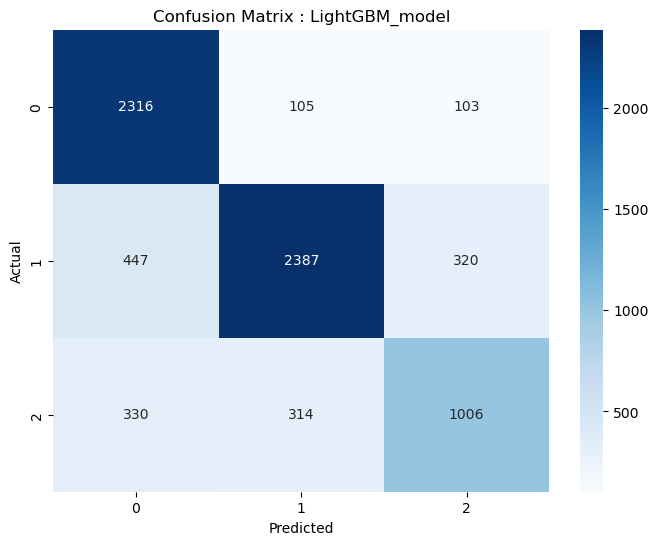

In [15]:
# Log the best model and its performance to MLflow, passing the algo_name as "xgboost"
log_mlflow("LightGBM", best_model, study.best_params) 

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.7 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



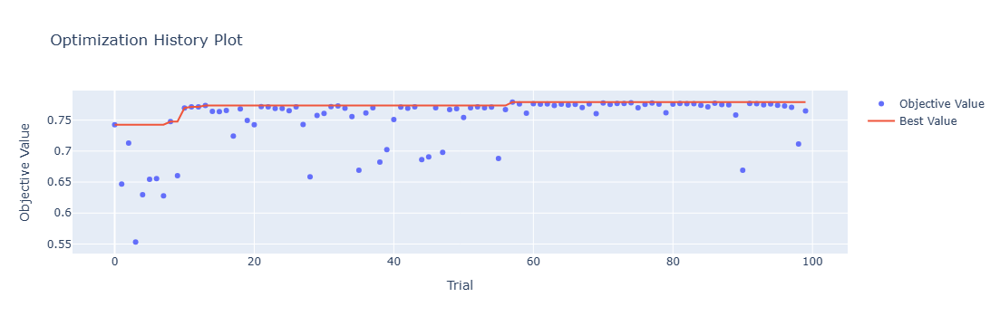

C:\Users\venka\anaconda3\envs\DL_TF_GPU_MLFlow_env\lib\site-packages\plotly\io\_renderers.py:51: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.7 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



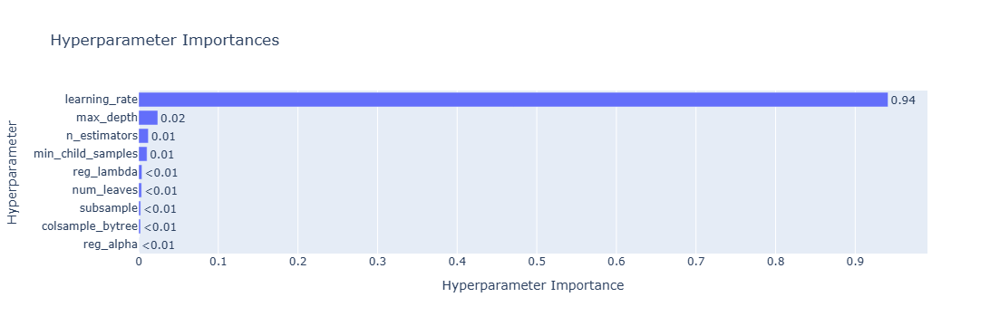

In [16]:
# Visualize optimization history and parameter importance
import plotly

optuna.visualization.plot_optimization_history(study).show()
optuna.visualization.plot_param_importances   (study).show()